# Generative Adversarial Networks

For this part of the assignment you implement two different types of generative adversarial networks. We will train the networks on a dataset of cat face images.

In [66]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [67]:
import os
datadir = "/content/drive/MyDrive/Colab/DL_CV_MP4/"
if not os.path.exists(datadir):
  !ln -s "/content/drive/My Drive/Colab/DL_CV_MP4/" $datadir
os.chdir(datadir)
!pwd

/content/drive/MyDrive/Colab/DL_CV_MP4


In [68]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [69]:

from gan.train import train

In [70]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "gpu")

# GAN loss functions

In this assignment you will implement two different types of GAN cost functions. You will first implement the loss from the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf). You will also implement the loss from [LS-GAN](https://arxiv.org/abs/1611.04076). 

### GAN loss

**TODO:** Implement the `discriminator_loss` and `generator_loss` functions in `gan/losses.py`.

The generator loss is given by:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: You should use the `torch.nn.functional.binary_cross_entropy_with_logits` function to compute the binary cross entropy loss since it is more numerically stable than using a softmax followed by BCE loss. The BCE loss is needed to compute the log probability of the true label given the logits output from the discriminator. Given a score $s\in\mathbb{R}$ and a label $y\in\{0, 1\}$, the binary cross entropy loss is

$$ bce(s, y) = -y * \log(s) - (1 - y) * \log(1 - s) $$


Instead of computing the expectation of $\log D(G(z))$, $\log D(x)$ and $\log \left(1-D(G(z))\right)$, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing.

In [71]:
from gan.losses import discriminator_loss, generator_loss

### Least Squares GAN loss

**TODO:** Implement the `ls_discriminator_loss` and `ls_generator_loss` functions in `gan/losses.py`.

We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alernative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`scores_real` and `scores_fake`).

In [72]:
from gan.losses import ls_discriminator_loss, ls_generator_loss

# GAN model architecture

**TODO:** Implement the `Discriminator` and `Generator` networks in `gan/models.py`.

We recommend the following architectures which are inspired by [DCGAN](https://arxiv.org/pdf/1511.06434.pdf):

**Discriminator:**

- convolutional layer with in_channels=3, out_channels=128, kernel=4, stride=2
- convolutional layer with in_channels=128, out_channels=256, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=256, out_channels=512, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=512, out_channels=1024, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=1024, out_channels=1, kernel=4, stride=1

Use padding = 1 (not 0) for all the convolutional layers.

Instead of Relu we LeakyReLu throughout the discriminator (we use a negative slope value of 0.2). You can use simply use relu as well.

The output of your discriminator should be a single value score corresponding to each input sample. See `torch.nn.LeakyReLU`.


**Generator:**

**Note:** In the generator, you will need to use transposed convolution (sometimes known as fractionally-strided convolution or deconvolution). This function is implemented in pytorch as `torch.nn.ConvTranspose2d`.

- transpose convolution with in_channels=NOISE_DIM, out_channels=1024, kernel=4, stride=1
- batch norm
- transpose convolution with in_channels=1024, out_channels=512, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=512, out_channels=256, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=256, out_channels=128, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=128, out_channels=3, kernel=4, stride=2

The output of the final layer of the generator network should have a `tanh` nonlinearity to output values between -1 and 1. The output should be a 3x64x64 tensor for each sample (equal dimensions to the images from the dataset).





In [73]:
from gan.models import Discriminator, Generator

# Data loading

The cat images we provide are RGB images with a resolution of 64x64. In order to prevent our discriminator from overfitting, we will need to perform some data augmentation.

**TODO:** Implement data augmentation by adding new transforms to the cell below. At the minimum, you should have a RandomCrop and a ColorJitter, but we encourage you to experiment with different augmentations to see how the performance of the GAN changes. See https://pytorch.org/vision/stable/transforms.html.


In [74]:
batch_size = 32
imsize = 64
cat_root = './cats'

cat_train = ImageFolder(root=cat_root, transform=transforms.Compose([
    # transforms.RandomResizedCrop(imsize, scale=(0.8, 1.0), ratio=(0.8, 1.2)),
    
    transforms.Resize(int(1.03 * imsize)),
    transforms.RandomCrop(imsize),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
    transforms.RandomHorizontalFlip(),
    # transforms.RandomRotation(10),
    transforms.ToTensor(),
]))

cat_loader_train = DataLoader(cat_train, batch_size=batch_size, drop_last=True)

### Visualize dataset

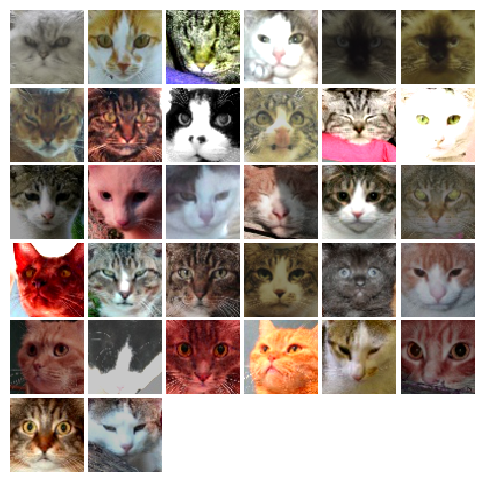

In [75]:
from gan.utils import show_images

imgs = next(iter(cat_loader_train))[0].numpy().squeeze()
show_images(imgs, color=True)

# Training 


**TODO:** Fill in the training loop in `gan/train.py`.

In [49]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001

### Train GAN

In [50]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [51]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 1.444, G:5.948


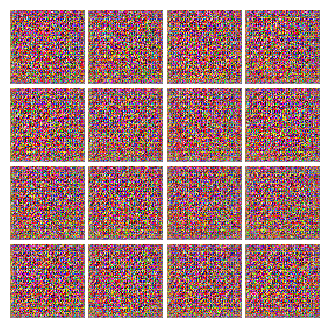


EPOCH:  2
Iter: 250, D: 1.672, G:0.465


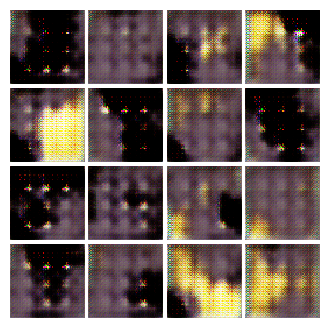


EPOCH:  3
Iter: 500, D: 0.4963, G:2.017


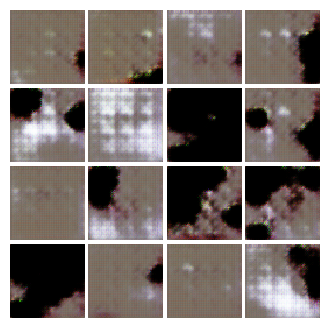


EPOCH:  4
EPOCH:  5
Iter: 750, D: 0.6997, G:3.661


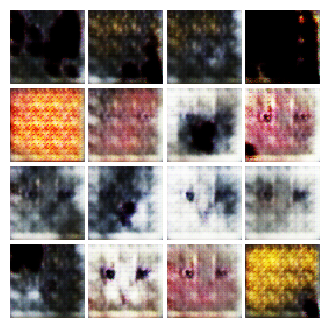


EPOCH:  6
Iter: 1000, D: 1.25, G:1.387


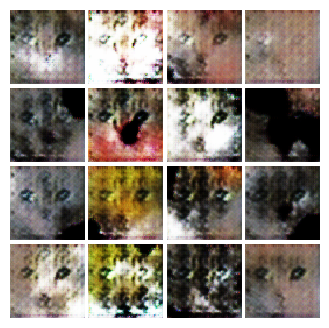


EPOCH:  7
EPOCH:  8
Iter: 1250, D: 1.044, G:1.092


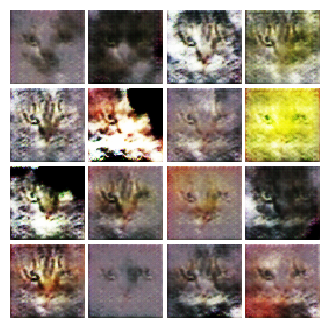


EPOCH:  9
Iter: 1500, D: 1.226, G:2.998


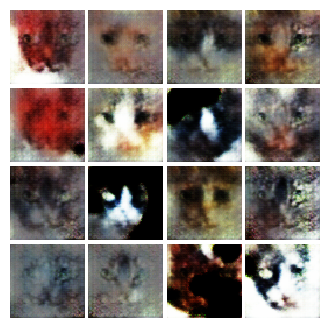


EPOCH:  10
EPOCH:  11
Iter: 1750, D: 0.8838, G:2.882


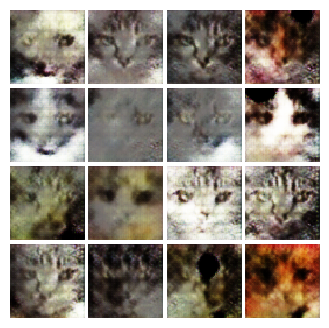


EPOCH:  12
Iter: 2000, D: 0.681, G:2.892


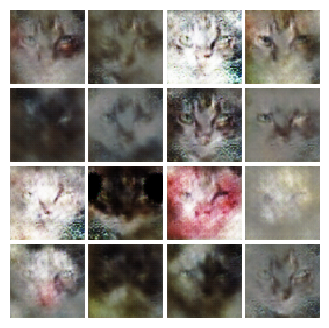


EPOCH:  13
Iter: 2250, D: 0.7298, G:2.53


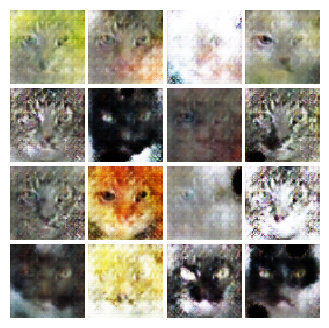


EPOCH:  14
EPOCH:  15
Iter: 2500, D: 0.8032, G:3.302


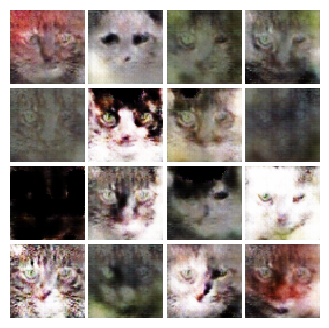


EPOCH:  16
Iter: 2750, D: 0.7184, G:3.482


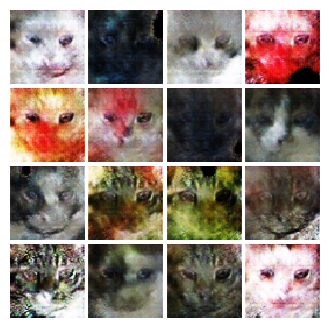


EPOCH:  17
EPOCH:  18
Iter: 3000, D: 1.085, G:4.154


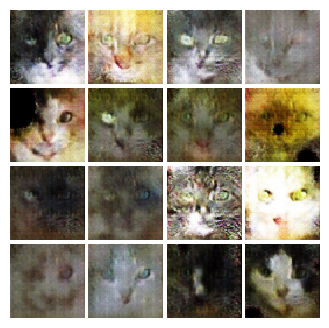


EPOCH:  19
Iter: 3250, D: 0.4453, G:5.633


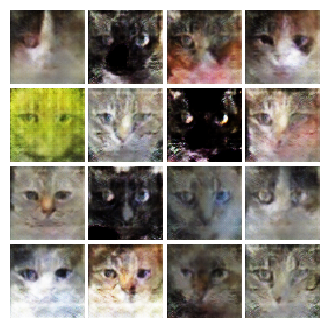


EPOCH:  20
EPOCH:  21
Iter: 3500, D: 0.6235, G:3.681


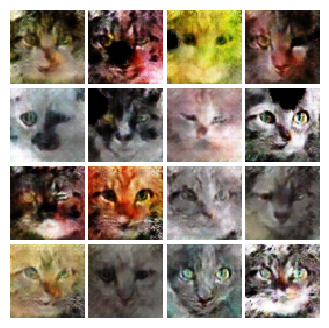


EPOCH:  22
Iter: 3750, D: 0.948, G:3.592


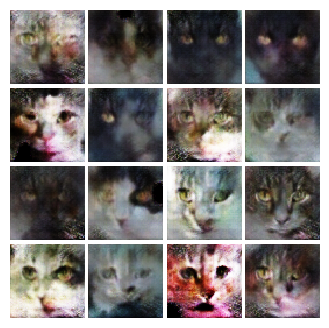


EPOCH:  23
Iter: 4000, D: 1.189, G:6.085


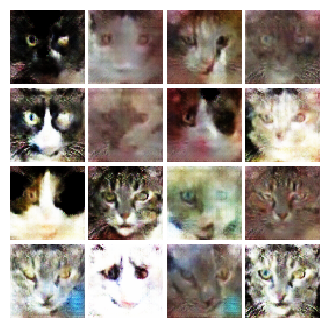


EPOCH:  24
EPOCH:  25
Iter: 4250, D: 1.793, G:10.03


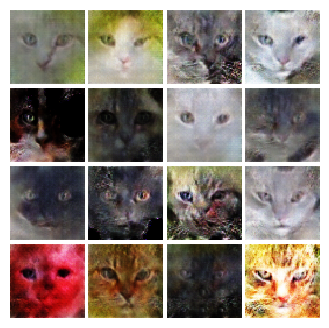


EPOCH:  26
Iter: 4500, D: 0.2801, G:4.44


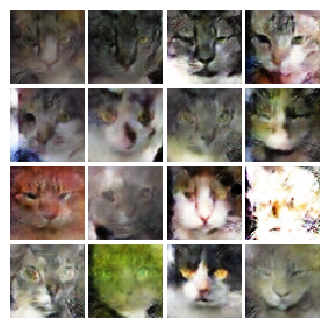


EPOCH:  27
EPOCH:  28
Iter: 4750, D: 0.2874, G:4.999


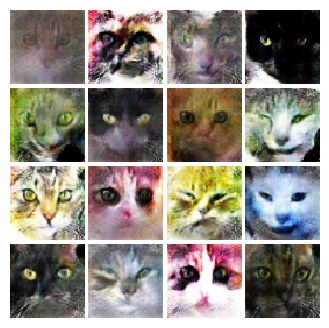


EPOCH:  29
Iter: 5000, D: 0.3753, G:3.002


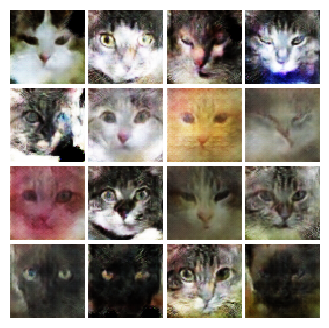


EPOCH:  30
EPOCH:  31
Iter: 5250, D: 0.2228, G:3.631


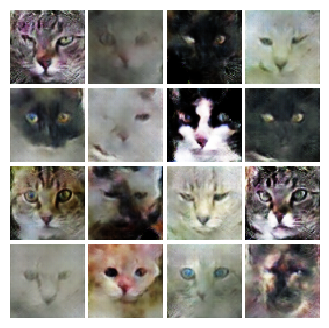


EPOCH:  32
Iter: 5500, D: 0.4522, G:4.707


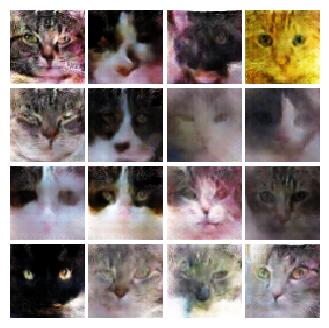


EPOCH:  33
EPOCH:  34
Iter: 5750, D: 0.3983, G:5.884


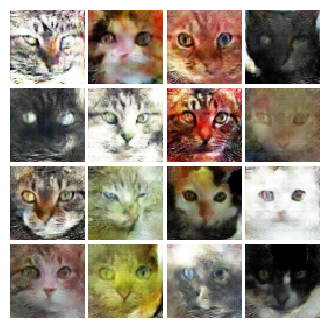


EPOCH:  35
Iter: 6000, D: 0.3834, G:5.113


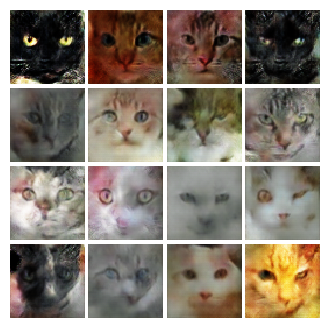


EPOCH:  36
Iter: 6250, D: 0.3839, G:4.542


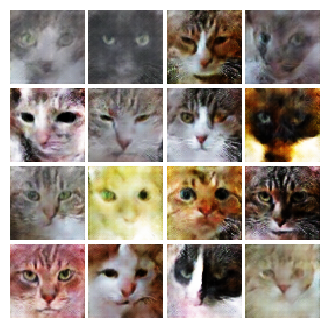


EPOCH:  37
EPOCH:  38
Iter: 6500, D: 0.2592, G:5.757


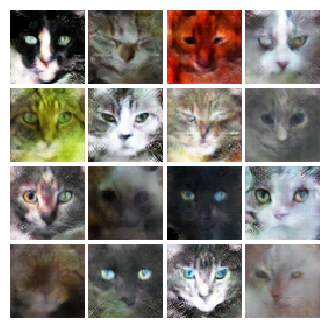


EPOCH:  39
Iter: 6750, D: 0.3039, G:4.363


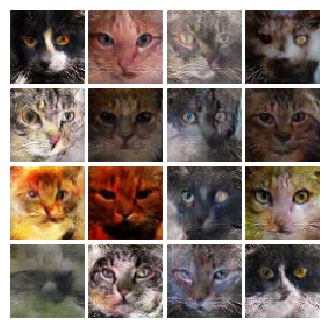


EPOCH:  40
EPOCH:  41
Iter: 7000, D: 0.9823, G:1.754


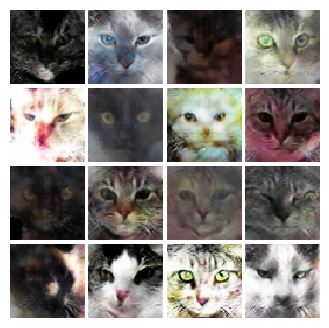


EPOCH:  42
Iter: 7250, D: 0.1044, G:4.631


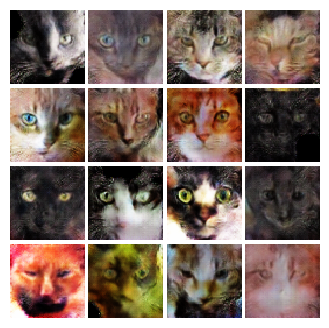


EPOCH:  43
EPOCH:  44
Iter: 7500, D: 0.4427, G:4.02


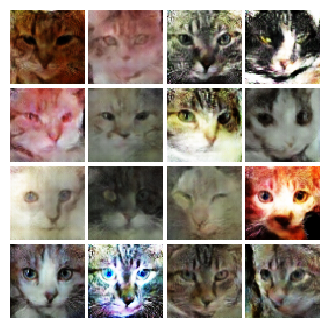


EPOCH:  45
Iter: 7750, D: 0.5055, G:5.738


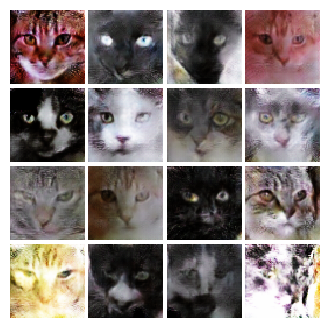


EPOCH:  46
Iter: 8000, D: 0.5226, G:5.54


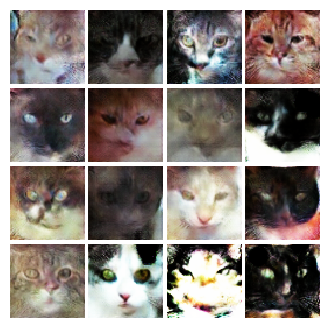


EPOCH:  47
EPOCH:  48
Iter: 8250, D: 1.425, G:2.517


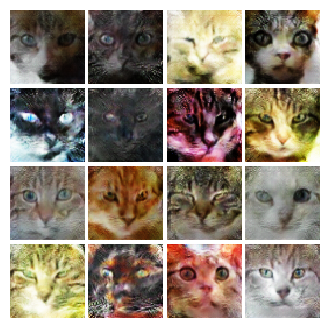


EPOCH:  49
Iter: 8500, D: 0.2345, G:4.069


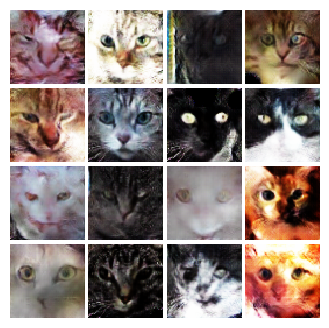


EPOCH:  50


In [52]:
# original gan
train(D, G, D_optimizer, G_optimizer, discriminator_loss, 
          generator_loss, num_epochs=NUM_EPOCHS, show_every=250,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)


### Train LS-GAN

In [76]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [77]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 0.2523, G:0.4806


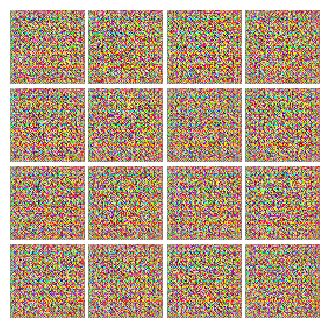


EPOCH:  2
Iter: 250, D: 0.00231, G:0.4956


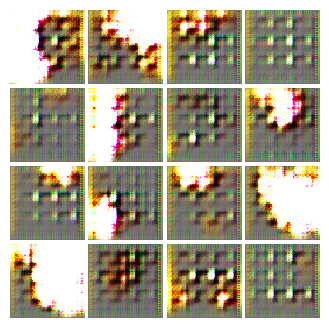


EPOCH:  3
Iter: 500, D: 0.1314, G:0.4963


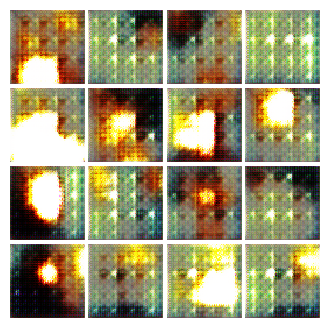


EPOCH:  4
EPOCH:  5
Iter: 750, D: 0.06064, G:0.4952


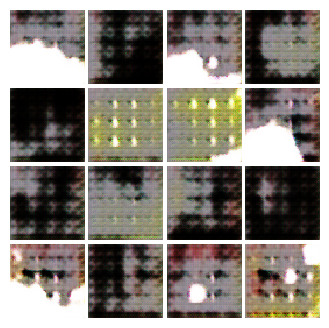


EPOCH:  6
Iter: 1000, D: 0.3506, G:0.4937


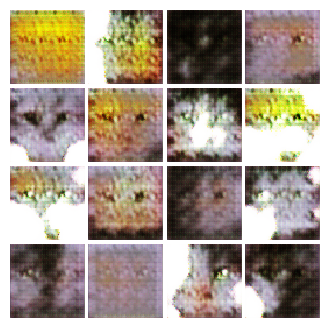


EPOCH:  7
EPOCH:  8
Iter: 1250, D: 0.008873, G:0.4783


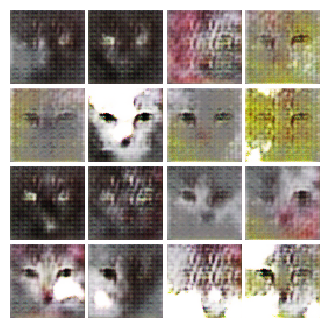


EPOCH:  9
Iter: 1500, D: 0.09861, G:0.3693


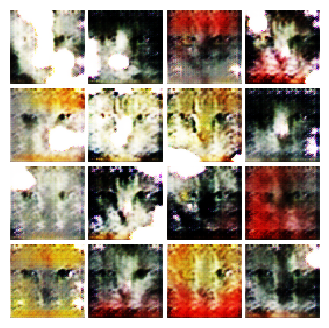


EPOCH:  10
EPOCH:  11
Iter: 1750, D: 0.03619, G:0.448


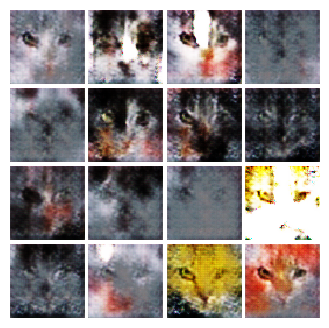


EPOCH:  12
Iter: 2000, D: 0.1865, G:0.4623


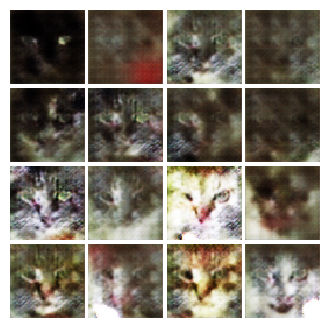


EPOCH:  13
Iter: 2250, D: 0.07322, G:0.4937


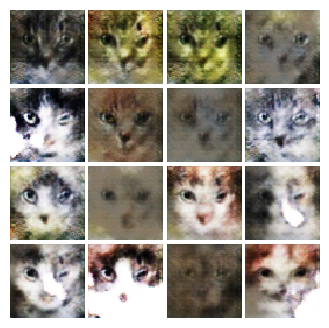


EPOCH:  14
EPOCH:  15
Iter: 2500, D: 0.01795, G:0.4568


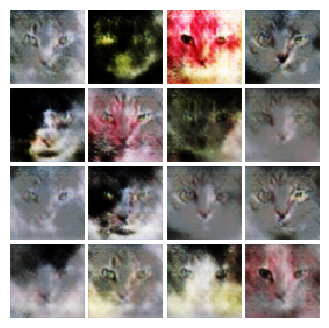


EPOCH:  16
Iter: 2750, D: 0.04115, G:0.4553


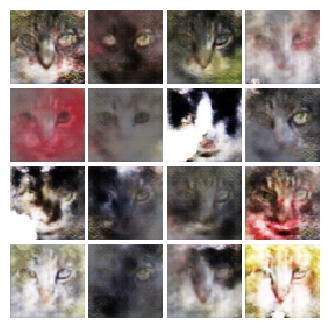


EPOCH:  17
EPOCH:  18
Iter: 3000, D: 0.2259, G:0.4922


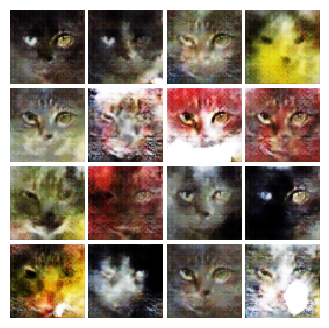


EPOCH:  19
Iter: 3250, D: 0.1546, G:0.4967


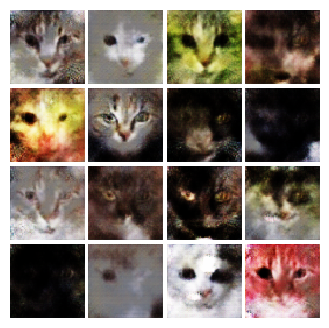


EPOCH:  20
EPOCH:  21
Iter: 3500, D: 0.0008602, G:0.4496


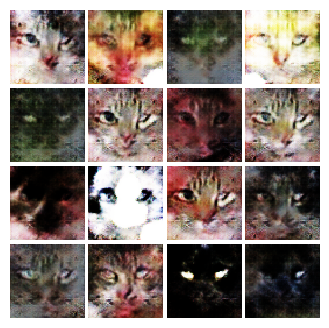


EPOCH:  22
Iter: 3750, D: 0.006061, G:0.4873


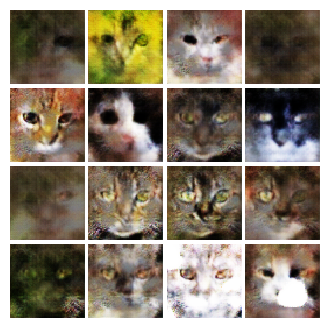


EPOCH:  23
Iter: 4000, D: 0.004892, G:0.4834


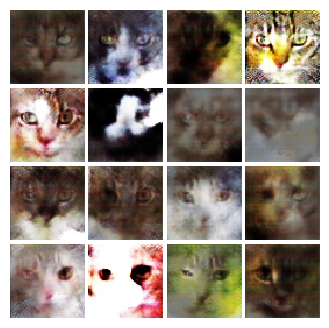


EPOCH:  24
EPOCH:  25
Iter: 4250, D: 0.04588, G:0.4957


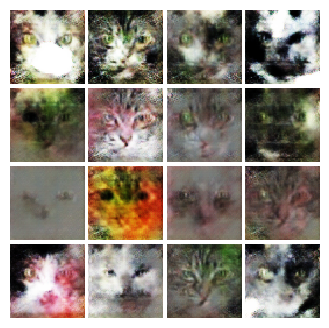


EPOCH:  26
Iter: 4500, D: 0.0002722, G:0.4967


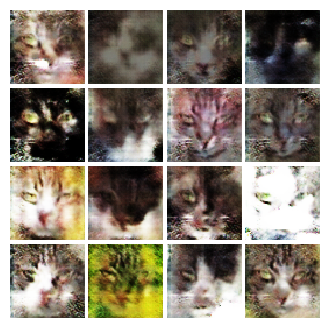


EPOCH:  27
EPOCH:  28
Iter: 4750, D: 0.00122, G:0.4953


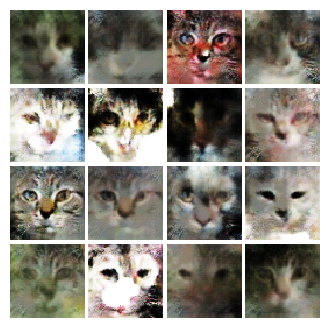


EPOCH:  29
Iter: 5000, D: 0.005138, G:0.499


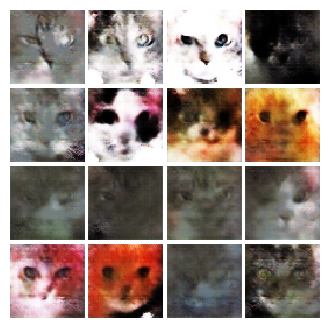


EPOCH:  30
EPOCH:  31
Iter: 5250, D: 0.03326, G:0.4945


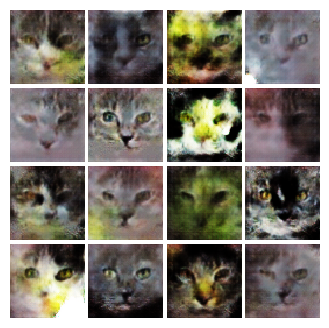


EPOCH:  32
Iter: 5500, D: 5.694e-06, G:0.4989


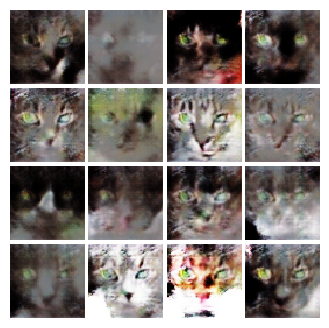


EPOCH:  33
EPOCH:  34
Iter: 5750, D: 0.02092, G:0.4995


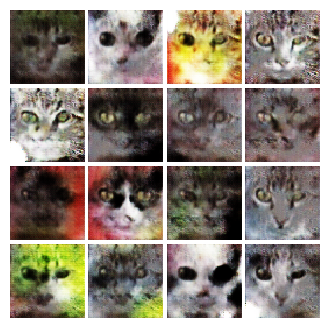


EPOCH:  35
Iter: 6000, D: 0.01389, G:0.4927


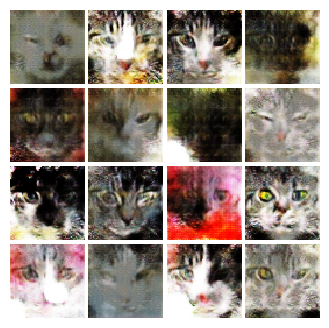


EPOCH:  36
Iter: 6250, D: 6.722e-05, G:0.4997


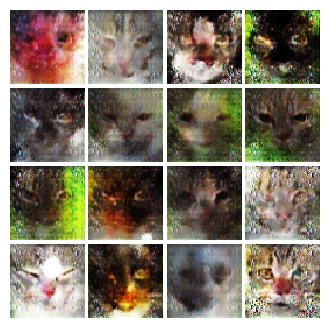


EPOCH:  37
EPOCH:  38
Iter: 6500, D: 0.001299, G:0.5


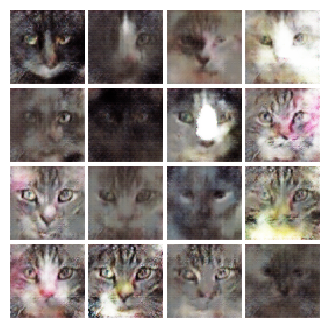


EPOCH:  39
Iter: 6750, D: 0.001058, G:0.4981


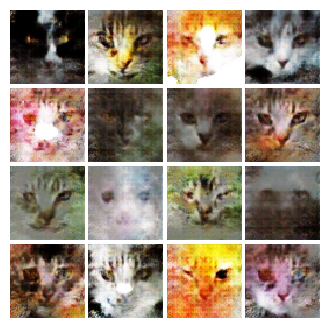


EPOCH:  40
EPOCH:  41
Iter: 7000, D: 0.1061, G:0.4999


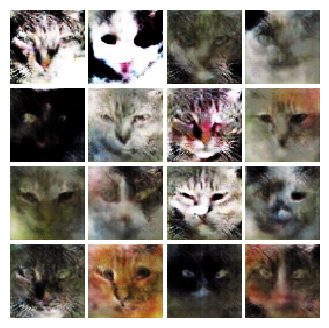


EPOCH:  42
Iter: 7250, D: 0.0002333, G:0.4997


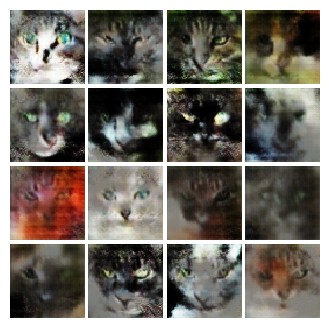


EPOCH:  43
EPOCH:  44
Iter: 7500, D: 0.01015, G:0.4968


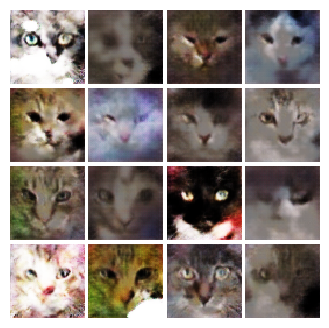


EPOCH:  45
Iter: 7750, D: 0.04409, G:0.4996


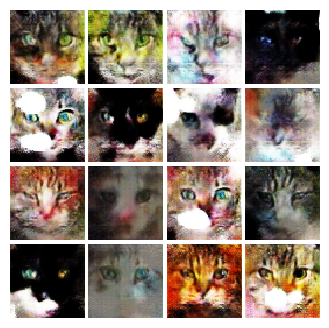


EPOCH:  46
Iter: 8000, D: 1.26e-07, G:0.5


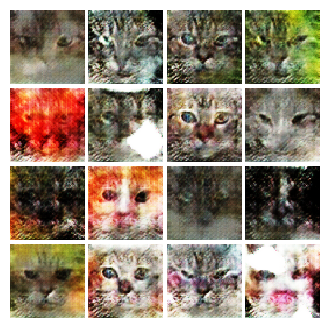


EPOCH:  47
EPOCH:  48
Iter: 8250, D: 0.03578, G:0.4995


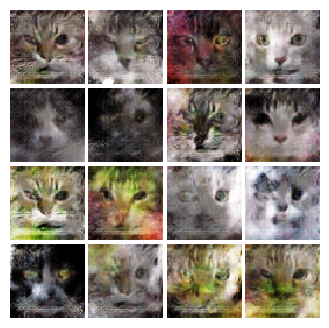


EPOCH:  49
Iter: 8500, D: 0.06451, G:0.499


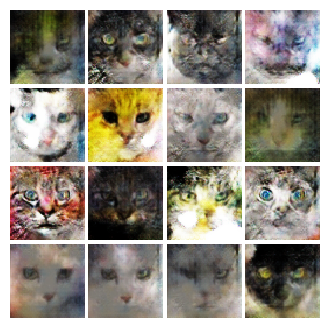


EPOCH:  50


In [78]:
# ls-gan
train(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, 
          ls_generator_loss, num_epochs=NUM_EPOCHS, show_every=250,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)